## Plotting overview of dataset and lineages for Figure 1

Some plots based on code from HLCA: https://github.com/LungCellAtlas/HLCA_reproducibility/blob/main/notebooks/1_building_and_annotating_the_atlas_core/11_figure_2_data_overview.ipynb

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

In [2]:
sc.logging.print_header()

scanpy==1.7.1 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [4]:
sc.set_figure_params(
    dpi=300,dpi_save=600,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [5]:
sns.set_style(style="white")
sns.set_context(context="paper")

In [6]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_healthy.no_doublets.annot_all_levels.updated_donorID.20230126.metadata_update.20230421.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 1077241 × 36601
    var: 'gene_ids', 'feature_type', 'mito', 'ribo', 'hb', 'n_counts', 'n_counts_raw', 'n_counts_spliced', 'n_counts_unspliced', 'n_cells', 'n_cells_raw', 'n_cells_spliced', 'n_cells_unspliced', 'cc', 'ig', 'tcr'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'age_unified_colors', 'broad_annot_20220914_colors', 'broad_annot_20220917_colors', 'elmentaite21_pred_colors', 'fine_annot_colors', 'hvg', 'level2_annot_colors', 'neighbors', 'neighbors_scvi', 'organ_unified_colors', 'study_colors', 'umap'
    obsm: 'X_mde', 'X_scvi', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'connectivities', 'distances', 'neighbors_scvi_connectivities', 'neighbors_scvi_distances'

In [8]:
adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_healthy.no_doublets.annot_all_levels.updated_donorID.20230126.metadata_update.20230421.csv',index_col=0)

/home/jovyan/my-conda-envs/standard/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (73,83,84,86,93) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [9]:
adata

AnnData object with n_obs × n_vars = 1077241 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [10]:
pd.set_option('display.max_rows', 500)

In [11]:
adata.obs.level_3_annot.value_counts()

Enterocyte                            66321
Keratinocyte_stratified               63400
B_plasma_IgA1                         54360
Mesoderm_2                            53169
Crypt_fibroblast_PI16                 41313
Lamina_propria_fibroblast_ADAMDEC1    37736
B_naive                               36366
Colonocyte                            34151
B_memory                              33026
Mesoderm_1                            30022
EC_venous                             28164
Trm_CD4                               26269
Tnaive/cm_CD4                         24797
Trm_CD8                               24711
Villus_fibroblast_F3                  20819
TA                                    19674
Cycling_fibroblast                    18017
Goblet                                17475
Mature_colonocyte                     16354
Trm/em_CD8                            16334
Epithelial_cycling_G2M                15948
Myofibroblast                         15509
Epithelial_cycling_S            

In [12]:
# Count the occurrences of the specific column value
count_value = adata.obs['level_3_annot'].value_counts()

# Calculate the percentage
percentage = (count_value / len(adata.obs)) * 100

print(percentage)

Enterocyte                            6.156561
Keratinocyte_stratified               5.885405
B_plasma_IgA1                         5.046225
Mesoderm_2                            4.935664
Crypt_fibroblast_PI16                 3.835075
Lamina_propria_fibroblast_ADAMDEC1    3.503023
B_naive                               3.375846
Colonocyte                            3.170228
B_memory                              3.065795
Mesoderm_1                            2.786934
EC_venous                             2.614457
Trm_CD4                               2.438544
Tnaive/cm_CD4                         2.301899
Trm_CD8                               2.293916
Villus_fibroblast_F3                  1.932622
TA                                    1.826332
Cycling_fibroblast                    1.672513
Goblet                                1.622200
Mature_colonocyte                     1.518138
Trm/em_CD8                            1.516281
Epithelial_cycling_G2M                1.480449
Myofibroblast

In [13]:
dc = adata[adata.obs.level_3_annot.isin(['DC_langerhans'])]

In [14]:
dc.obs.organ_unified.value_counts()

ileum               38
stomach             21
MLN                 15
duodenum            14
colon               13
transverse          12
sigmoid colon       11
oesophagus           7
gingival mucosa      7
small intestine      7
caecum               5
salivary gland       5
intestine            2
jejunum              2
appendix             2
descending colon     1
ascending colon      1
buccal mucosa        1
Name: organ_unified, dtype: int64

In [16]:
data = list(adata.obs.level_3_annot.unique())

In [17]:
pd.set_option('display.max_rows', 500)
pd.crosstab(adata.obs.level_3_annot,adata.obs.level_1_annot)

level_1_annot,B and B plasma,Endothelial,Epithelial,Mesenchymal,Myeloid,Neural,T and NK cells
level_3_annot,,,,,,,
Angiogenic_pericyte,0,0,0,849,0,0,0
BEST4_enterocyte_colonocyte,0,0,11287,0,0,0,0
B_GC_I,3573,0,0,0,0,0,0
B_GC_II,3499,0,0,0,0,0,0
B_memory,33026,0,0,0,0,0,0
B_naive,36366,0,0,0,0,0,0
B_plasma_IgA1,54360,0,0,0,0,0,0
B_plasma_IgA2,4888,0,0,0,0,0,0
B_plasma_IgG,7033,0,0,0,0,0,0


In [18]:
import csv        

with open('output.tsv', 'w') as f_output:
    tsv_output = csv.writer(f_output, delimiter='\t')
    tsv_output.writerow(data)

adata.obs['level2_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {'EC_venous':'Vascular_endothelia',
 'Mast':'Granulocyte',
 'EC_capillary':'Vascular_endothelia',
 'DC_cDC1':'DC',
 'Monocyte':'Monocyte',
 'DC_cDC2':'DC',
 'Basal':'Basal',
 'Treg_IL10':'Treg',
 'Crypt_fibroblast_PI16':'Fibroblast',
 'Macrophage':'Macrophage',
 'Vascular_smooth_muscle':'Smooth_muscle',
 'Lamina_propria_fibroblast_ADAMDEC1':'Fibroblast',
 'Epithelial_cycling_G2M':'Cycling_epithelia',
 'Keratinocyte_stratified':'Keratinocyte',
 'Trm/em_CD8':'Conventional_CD8',
 'Pericyte':'Pericyte',
 'Oral_mucosa_fibroblast':'Fibroblast',
 'Macrophage_MMP9':'Macrophage',
 'EC_lymphatic':'Lymphatic_endothelia',
 'Rectum_fibroblast':'Fibroblast',
 'Trm_Th17':'Conventional_CD4',
 'DC_migratory':'DC',
 'Epithelial_cycling_S':'Cycling_epithelia',
 'Trm_CD4':'Conventional_CD4',
 'NK_CD16':'NK',
 'Macrophage_LYVE1':'Macrophage',
 'Trm_CD8':'Conventional_CD8',
 'Macrophage_TREM2':'Macrophage',
 'Keratinocyte_inflammatory':'Keratinocyte',
 'Tnaive/cm_CD4':'Conventional_CD4',
 'DC_pDC':'DC',
 'Villus_fibroblast_F3':'Fibroblast',
 'EC_arterial_2':'Vascular_endothelia',
 'EC_arterial_1':'Vascular_endothelia',
 'gdT':'Unconventional_T/ILC',
 'B_memory':'Mature_B',
 'T/NK_cycling':'Cycling_T/NK',
 'Immune_recruiting_pericyte':'Pericyte',
 'MAIT':'Unconventional_T/ILC',
 'ILC3':'Unconventional_T/ILC',
 'Melanocyte':'Melanocyte',
 'Tfh_naive':'Conventional_CD4',
 'Keratinocyte_outer':'Keratinocyte',
 'EC_cycling':'Cycling_endothelia',
 'Tnaive/cm_CD8':'Conventional_CD8',
 'NK_CD56bright':'NK',
 'B_naive':'Mature_B',
 'B_preB':'Immature_B',
 'Treg':'Treg',
 'B_proB':'Immature_B',
 'B_plasmablast':'B_plasma',
 'B_plasma_IgG':'B_plasma',
 'Megakaryocyte/platelet':'Megakaryocyte/platelet',
 'TA_cycling':'Transit_amplifying',
 'Mono/neutrophil_MPO':'Monocyte',
 'B_plasma_IgA1':'B_plasma',
 'Macrophage_CD5L':'Macrophage',
 'Tfh':'Conventional_CD4',
 'Oesophagus_fibroblast':'Fibroblast',
 'B_plasma_IgA2':'B_plasma',
 'gdT_naive':'Unconventional_T/ILC',
 'B_GC_I':'Mature_B',
 'TA':'Transit_amplifying',
 'B_plasma_IgM':'B_plasma',
 'DC_langerhans':'DC',
 'Fibroblast_reticular':'Lymphoid_stromal_cell',
 'B_GC_II':'Mature_B',
 'Follicular_DC':'Lymphoid_stromal_cell',
 'Microfold':'Microfold',
 'Enterocyte':'Absorptive',
 'Epithelial_stem':'Stem',
 'MUC5AC':'Secretory',
 'MUC6':'Secretory',
 'Cycling':'Cycling_epithelia',
 'Pareital':'Secretory',
 'Enteroendocrine_MX':'Enteroendocrine',
 'Myofibroblast': 'Myofibroblast',
 'Glial_2':'Glia',
 'Enteric_neural_crest_cycling':'Neuron_progenitor',
 'Enterochromaffin':'Enteroendocrine',
 'Chief':'Secretory',
 'Glial/Enteric_neural_crest':'Neuron_progenitor',
 'Enteroendocrine_G':'Secretory',
 'Neuroblast':'Neuron_progenitor',
 'Goblet_progenitor':'Secretory',
 'Goblet':'Secretory',
 'Enteroendocrine':'Enteroendocrine',
 'Erythrocytes':'Erythrocyte',
 'Enteroendocrine_X':'Enteroendocrine',
 'Glial_3':'Glia',
 'Goblet_cycling':'Secretory',
 'BEST4':'Absorptive',
 'Tuft':'Secretory',
 'Paneth':'Secretory',
 'Serous':'Salivary/Submucosal_glands',
 'Mucous':'Salivary/Submucosal_glands',
 'Duct':'Salivary/Submucosal_glands',
 'Seromucous':'Salivary/Submucosal_glands',
 'Myoepithelial':'Salivary/Submucosal_glands',
 'Ionocytes':'Secretory',
 'Colonocyte':'Absorptive',
 'Late_colonocyte':'Absorptive',
 'Mesoderm_2':'Mesoderm',
 'Branch_A_inhibtory_motor_neuron':'Neuron',
 'SMC_PPLP2':'Smooth_muscle',
 'Cycling_fibroblast':'Fibroblast',
 'ICC':'Intestinal_Cajal_cell',
 'Branch_B_excitatory_motor_neuron':'Neuron',
 'SMC_CAPN3':'Smooth_muscle',
 'Mesoderm_1':'Mesoderm',
 'Branch_B_primary_afferent_neuron':'Neuron',
 'Proximal_progenitor_DUO/JEJ':'Epithelial_progenitor',
 'SMC_CAPN3_cycling':'Smooth_muscle',
 'Glial_1':'Glia',
 'Branch_A_primary_afferent_neuron':'Neuron',
 'Branch_A_interneuron':'Neuron',
 'NTS':'Epithelial_progenitor',
 'Proximal_progenitor_ILE':'Epithelial_progenitor',
 'Enteroendocrine_progenitor':'Enteroendocrine',
 'Mesothelium':'Mesothelium',
 'Distal_progenitor':'Epithelial_progenitor',
 'Angiogenic_pericyte':'Pericyte',
 'Eosinophil/basophil':'Granulocyte',
 'CLDN10':'Epithelial_progenitor',
 'Distal_progenitor_PRAC1':'Epithelial_progenitor',
 'Immature_pericyte':'Pericyte',
 'Mesenchymal_LTO':'Lymphoid_stromal_cell',
 'Gastric_fetal_epithelial':'Epithelial_progenitor',
 'DSC_MUC17_cycling':'Secretory',
 'DSC_MUC17':'Secretory',
 'Gland_basal':'Salivary/Submucosal_glands',
 'Gland_fetal':'Salivary/Submucosal_glands',
 'Basal_cycling':'Basal',
 'Keratinocyte_fetal':'Keratinocyte',
 'Gland_duct':'Salivary/Submucosal_glands',
 'Gland_mucous':'Salivary/Submucosal_glands',
 'Myoblast/myocyte':'Myoblast/myocyte'
        
        
    }.get(x, x))
    .astype("category")
)

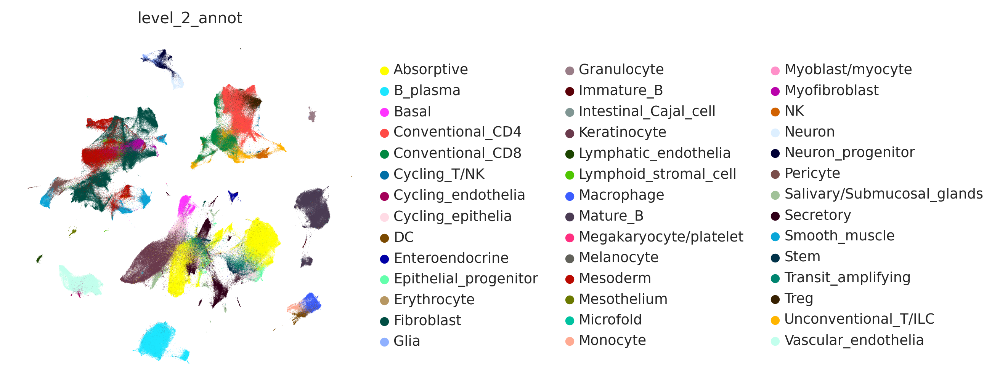

In [19]:
sc.pl.umap(adata,color='level_2_annot')

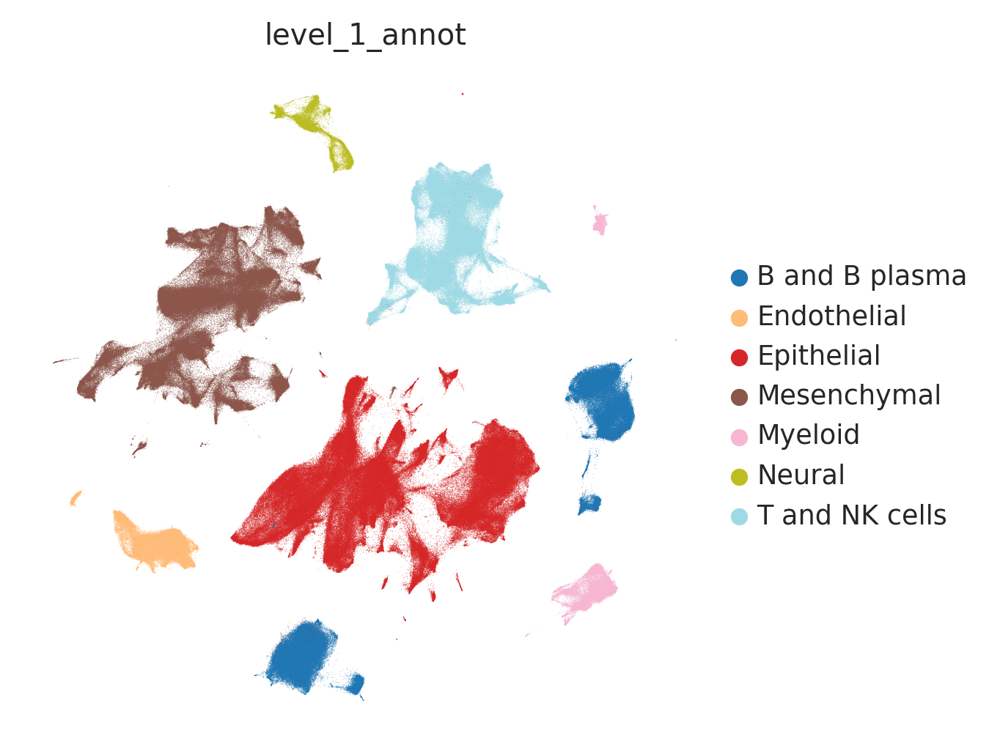

In [20]:
sc.pl.umap(adata,color='level_1_annot',palette='tab20')

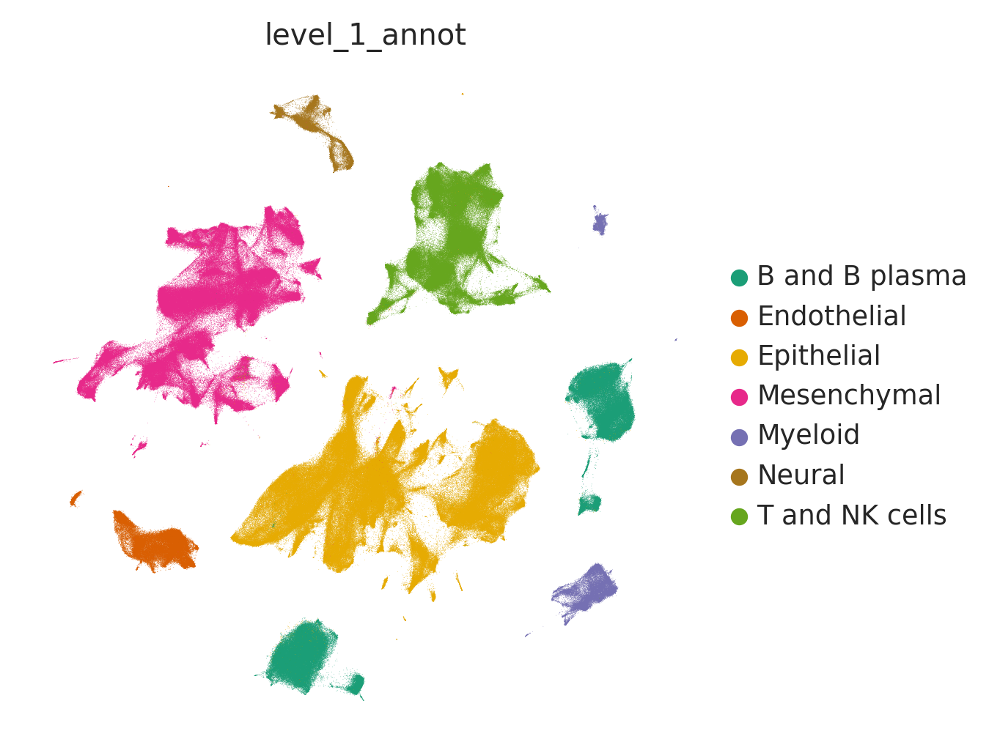

In [21]:
sc.pl.umap(adata,color='level_1_annot',palette=["#1B9E77",
                                                       "#D95F02", 
                                                       "#E6AB02", 
                                                       '#E7298A',  
                                                       "#7570B3",
                                                       "#A6761D",
                                                       "#66A61E"
                                                    ])

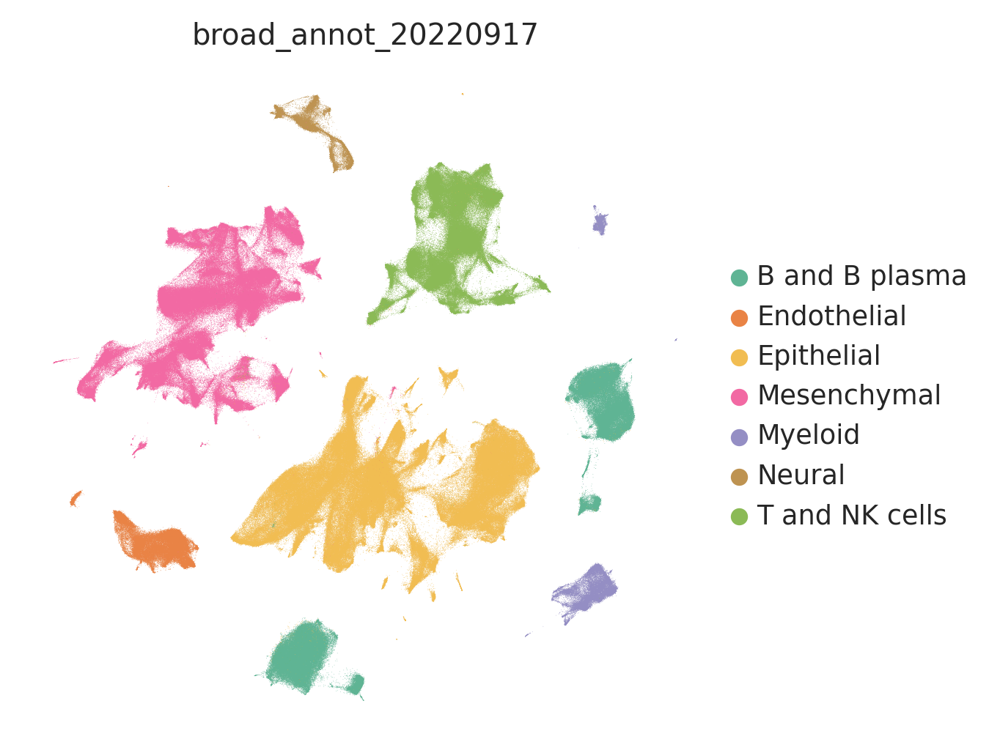

In [22]:
sc.pl.umap(adata,color='broad_annot_20220917',palette=["#5fb494",
                                                       "#e98345", 
                                                       "#f1bd52", 
                                                       '#f269a3',  
                                                       "#948ec4",
                                                       "#be9351",
                                                       "#8bba56"
                                                    ])

In [23]:
adata

AnnData object with n_obs × n_vars = 1077241 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [24]:
import sankey

annot = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/healthy_annotations_level1to3_20230127.csv')

adata

adata.uns['broad_annot_20220917_colors']

np.unique(adata.obs["broad_annot_20220917"])

In [25]:
coldict = {}
for ct, col in zip(np.unique(adata.obs["level_1_annot"]), adata.uns['level_1_annot_colors']):
    coldict[ct] = col

In [26]:
coldict

{'B and B plasma': '#1b9e77',
 'Endothelial': '#d95f02',
 'Epithelial': '#e6ab02',
 'Mesenchymal': '#e7298a',
 'Myeloid': '#7570b3',
 'Neural': '#a6761d',
 'T and NK cells': '#66a61e'}

In [27]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

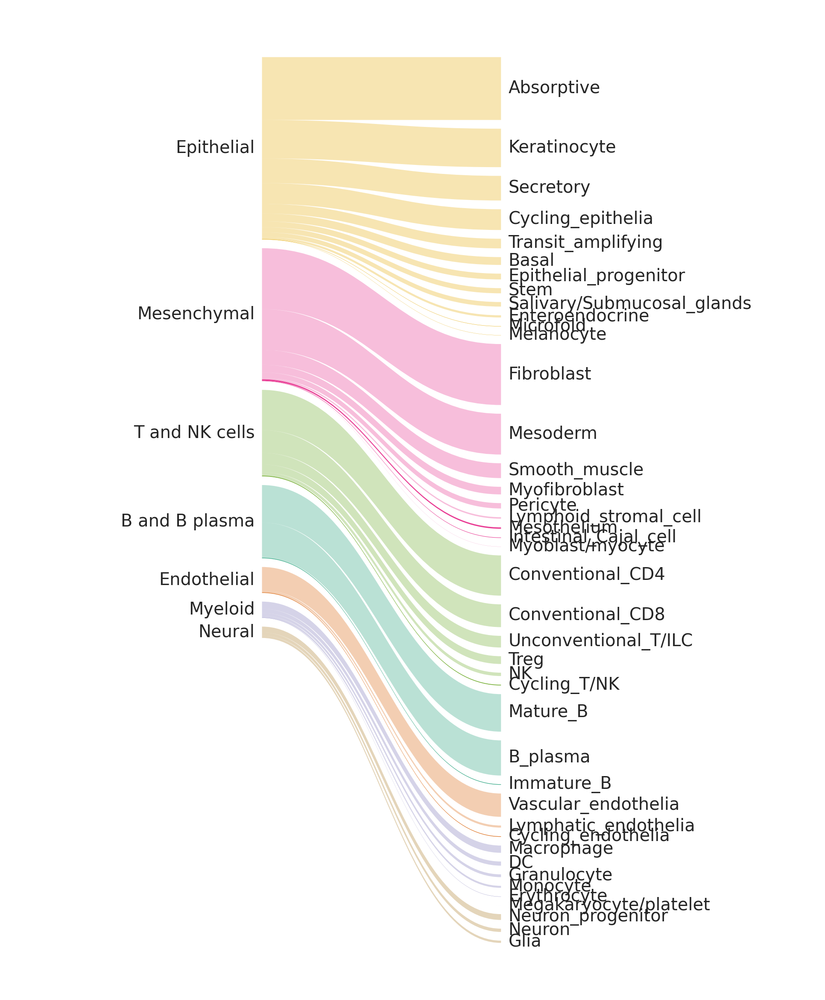

In [28]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=adata.obs["level_1_annot"], y=adata.obs["level_2_annot"], ax=ax, fontsize="medium",colors=coldict)
plt.savefig('level1to2_sankey.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [29]:
b = adata[adata.obs['broad_annot_20220917'].isin(['B and B plasma'])].copy()
tcell = adata[adata.obs['broad_annot_20220917'].isin(['T and NK cells'])].copy()
mye = adata[adata.obs['broad_annot_20220917'].isin(['Myeloid'])].copy()

In [30]:
tcell.obs.level_2_annot.value_counts()

Conventional_CD4        81967
Conventional_CD8        46444
Unconventional_T/ILC    23744
Treg                    15799
NK                       6806
Cycling_T/NK             1423
Name: level_2_annot, dtype: int64

In [31]:
coldict_t = {'Conventional_CD4':'#66a61e', 
             'Conventional_CD8':'#2d903e', 
             'Cycling_T/NK':'#202d2f', 
             'NK':'#084645',
             'Treg':'#005f50', 
             'Unconventional_T/ILC':'#00784d'}

In [32]:
coldict_t

{'Conventional_CD4': '#66a61e',
 'Conventional_CD8': '#2d903e',
 'Cycling_T/NK': '#202d2f',
 'NK': '#084645',
 'Treg': '#005f50',
 'Unconventional_T/ILC': '#00784d'}

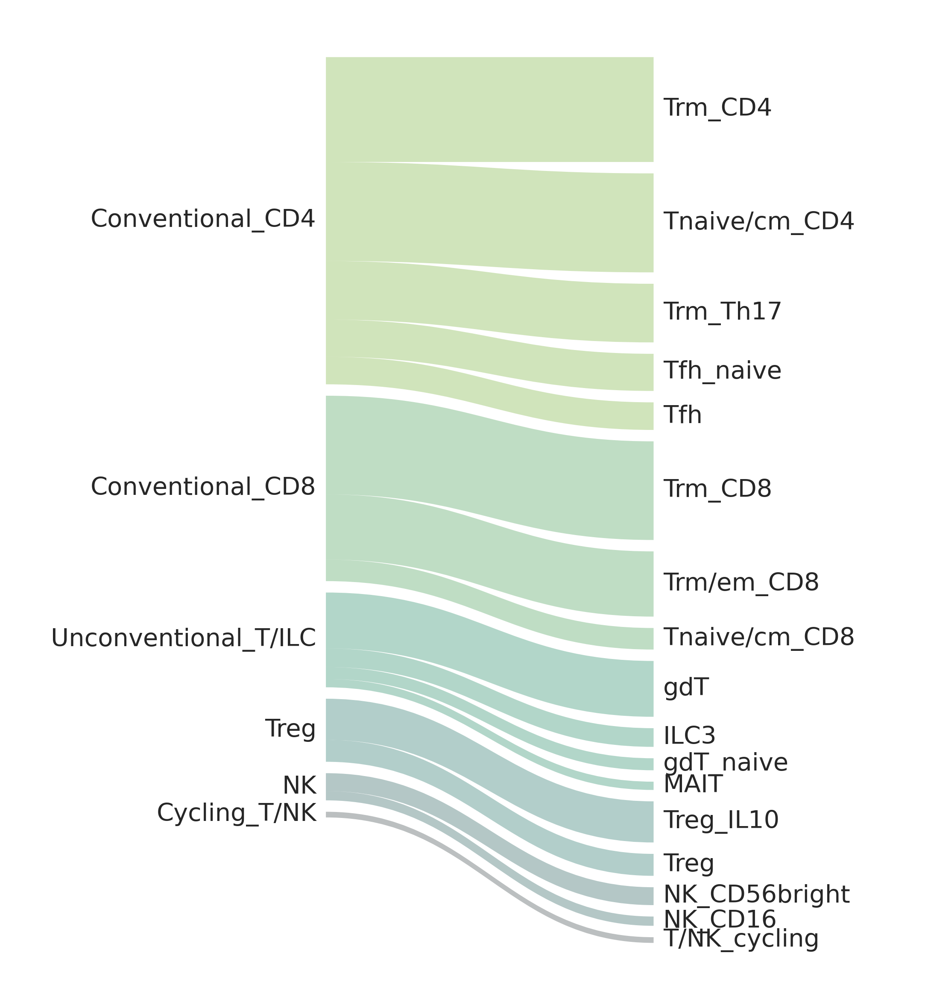

In [35]:
fig, ax = plt.subplots(figsize=(9,10))
sankey.sankey(x=tcell.obs["level_2_annot"], y=tcell.obs["level_3_annot"], ax=ax, fontsize="x-large",colors=coldict_t)
plt.savefig('level2to3_T_sankey.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [36]:
coldict_B = {'Mature_B':'#1b9e77',
'B_plasma':'#17b59c',
'Immature_B':'#23cbc1'}

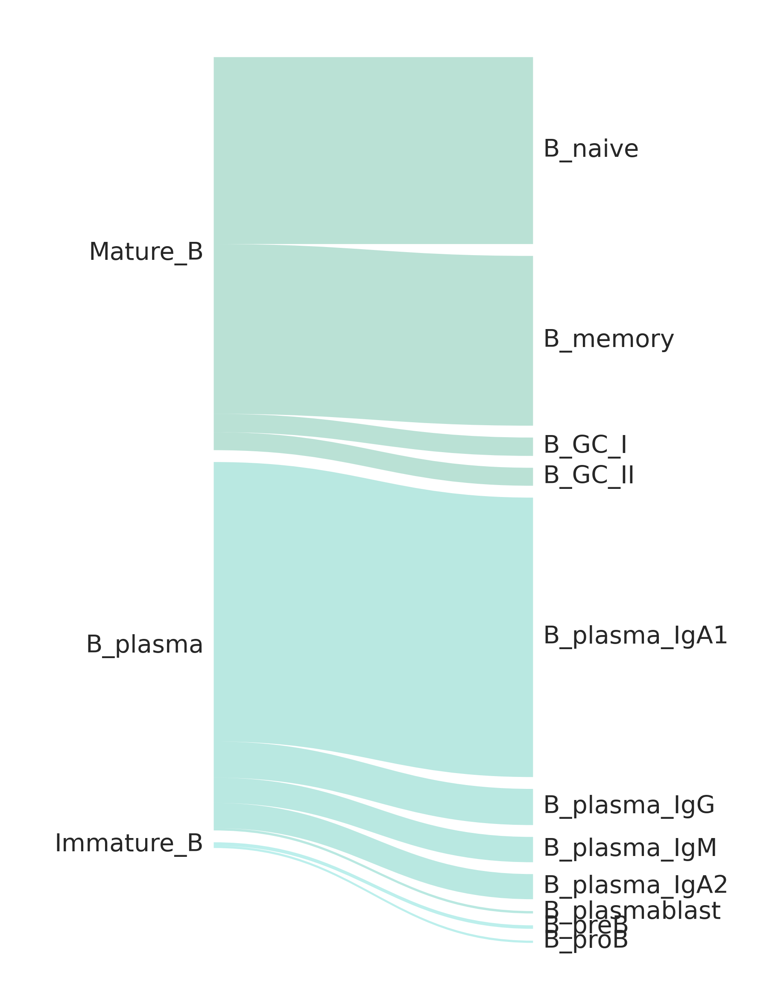

In [37]:
fig, ax = plt.subplots(figsize=(7.5,10))
sankey.sankey(x=b.obs["level_2_annot"], y=b.obs["level_3_annot"], ax=ax, fontsize="x-large",colors=coldict_B)
plt.savefig('level2to3_B_sankey.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [38]:
coldict_mye = {'Macrophage':'#7570b3',
'DC':'#6b5a97',
'Granulocyte':'#5f457c',
'Monocyte':'#523162',
'Erythrocyte':'#431d49',
'Megakaryocyte/platelet':'#340a31'
    
    
}

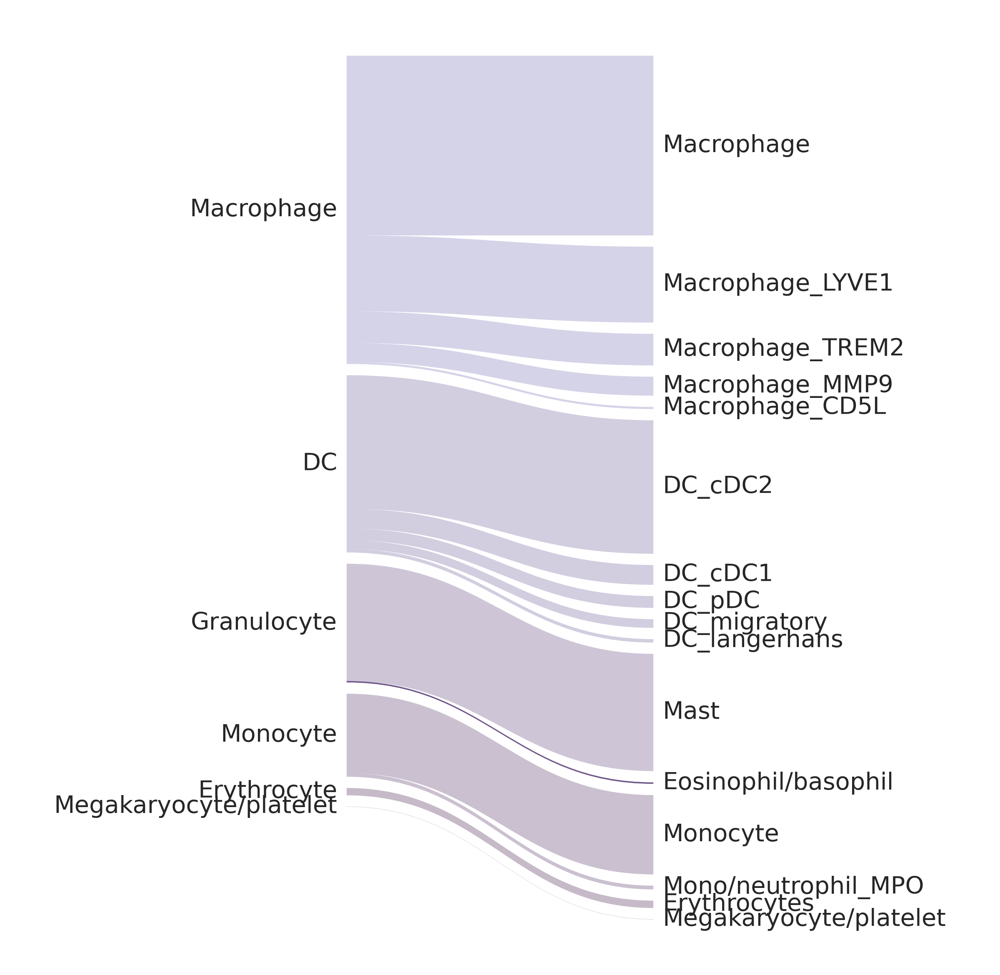

In [39]:
fig, ax = plt.subplots(figsize=(10,10))
sankey.sankey(x=mye.obs["level_2_annot"], y=mye.obs["level_3_annot"], ax=ax, fontsize="x-large",colors=coldict_mye)
plt.savefig('level2to3_mye_sankey.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

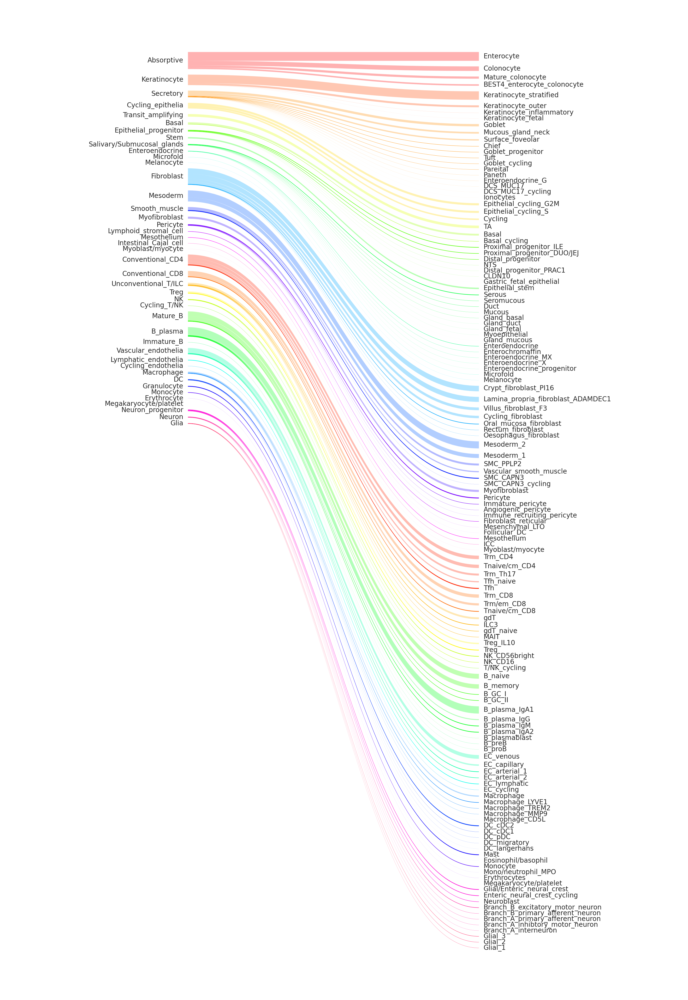

In [40]:
sankey_order = ['Absorptive','Keratinocyte','Secretory','Cycling_epithelia',
                'Transit_amplifying','Basal','Epithelial_progenitor','Stem',
                'Salivary/Submucosal_glands','Enteroendocrine','Microfold','Melanocyte',
               'Fibroblast','Mesoderm','Smooth_muscle','Myofibroblast','Pericyte',
               'Lymphoid_stromal_cell','Mesothelium','Intestinal_Cajal_cell','Myoblast/myocyte',
               'Conventional_CD4','Conventional_CD8','Unconventional_T/ILC','Treg','NK','Cycling_T/NK',
               'Mature_B','B_plasma','Immature_B','Vascular_endothelia','Lymphatic_endothelia',
                'Cycling_endothelia','Macrophage','DC','Granulocyte','Monocyte','Erythrocyte',
                'Megakaryocyte/platelet','Neuron_progenitor','Neuron','Glia'
               ]

fig, ax = plt.subplots(figsize=(12,18))
sankey.sankey(x=adata.obs["level_2_annot"], y=adata.obs["level_3_annot"], ax=ax, fontsize="x-small",left_order=sankey_order)
plt.savefig('level2to3_all.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [41]:
epi = adata[adata.obs['level_1_annot'].isin(['Epithelial'])].copy()

In [42]:
adata.obs.organ_broad.value_counts()

lowerGI_small    402804
lowerGI_large    280850
upperGI          260669
oral              97606
lymphoid          35312
Name: organ_broad, dtype: int64

In [43]:
list(adata.obs.organ_unified.unique())

['gingival mucosa',
 'stomach',
 'duodenum',
 'ileum',
 'salivary gland',
 'caecum',
 'colon',
 'MLN',
 'ascending colon',
 'transverse',
 'descending colon',
 'sigmoid colon',
 'rectum',
 'appendix',
 'jejunum',
 'oesophagus',
 'small intestine',
 'intestine',
 'periodontium',
 'buccal mucosa']

In [44]:
adata.obs.organ_groups.value_counts()

Small_intestine    438116
Large_intestine    280850
Stomach            143803
Oesophagus         116866
Oral_mucosa         73512
Salivary_gland      24094
Name: organ_groups, dtype: int64

In [45]:
epi.obs.organ_groups.unique()

['Oral_mucosa', 'Small_intestine', 'Stomach', 'Salivary_gland', 'Large_intestine', 'Oesophagus']
Categories (6, object): ['Oral_mucosa', 'Small_intestine', 'Stomach', 'Salivary_gland', 'Large_intestine', 'Oesophagus']

In [46]:
coldict_organ = {'Oral_mucosa':'#eedbdb','Salivary_gland':'#cecbcb','Oesophagus':'#f9d4a7',
                 'Stomach':'#edb75f','Small_intestine':'#feb2a8','Large_intestine':'#a36352'}



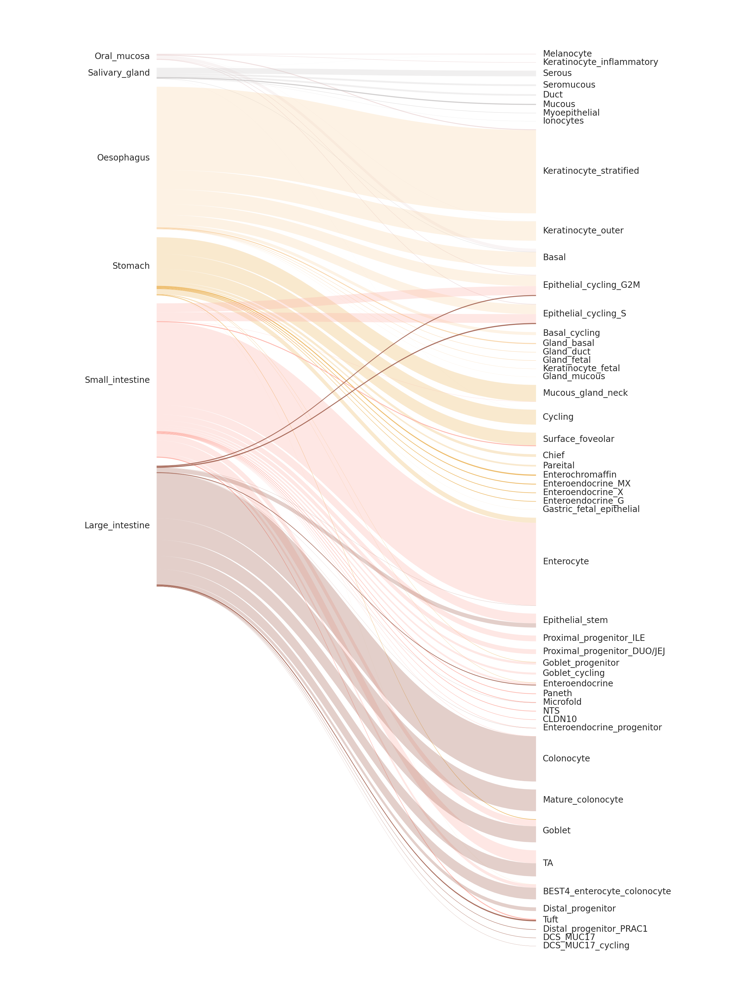

In [47]:
organ_order = ['Oral_mucosa','Salivary_gland','Oesophagus','Stomach','Small_intestine','Large_intestine']
fig, ax = plt.subplots(figsize=(10,14))
sankey.sankey(x=epi.obs["organ_groups"], y=epi.obs["level_3_annot"], ax=ax, fontsize="x-small",left_order=organ_order,colors=coldict_organ)
plt.savefig('epi_organ_to_fine_annot_sankeyJULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [48]:
epi_col = {'Absorptive':'#e6ab02','Keratinocyte':'#d19815',
           'Secretory':'#bc861e','Cycling_epithelia':'#a77422',
                'Transit_amplifying':'#936225','Basal':'#7f5126',
           'Epithelial_progenitor':'#6b4027','Stem':'#583026',
                'Salivary/Submucosal_glands':'#462124',
           'Enteroendocrine':'#331222','Microfold':'#2b122a','Melanocyte':'#201233'}

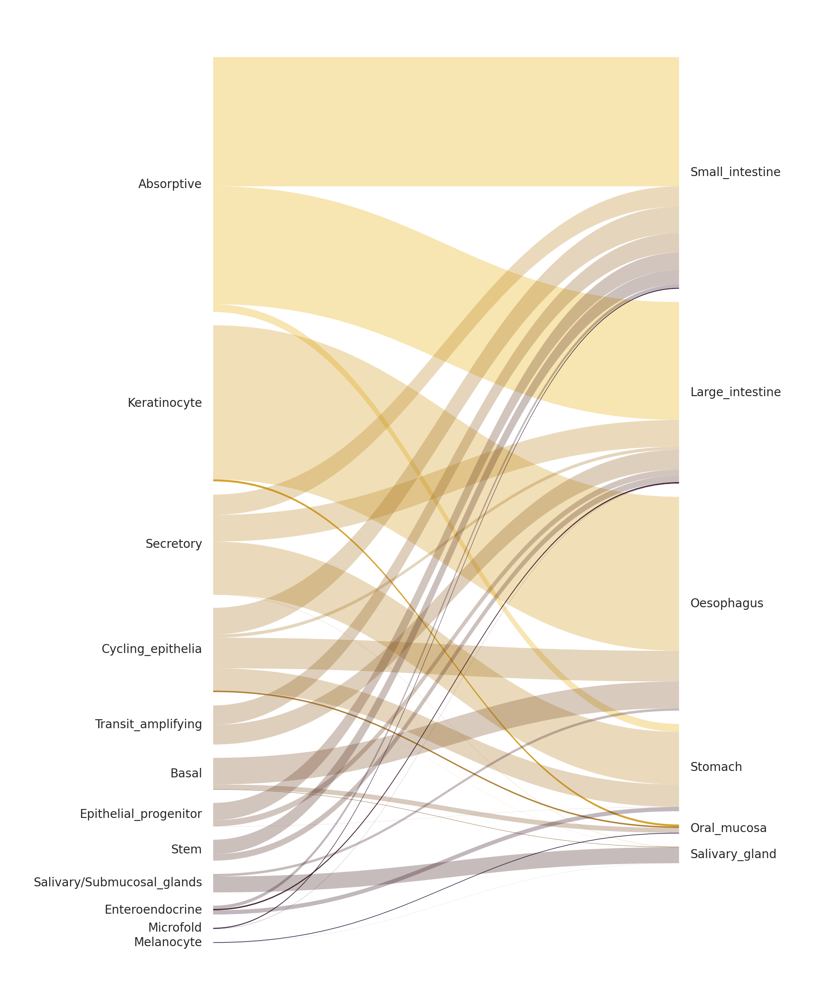

In [49]:
epi_order = ['Absorptive','Keratinocyte','Secretory','Cycling_epithelia',
                'Transit_amplifying','Basal','Epithelial_progenitor','Stem',
                'Salivary/Submucosal_glands','Enteroendocrine','Microfold','Melanocyte',
               ]

fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=epi.obs["level_2_annot"], y=epi.obs["organ_groups"], ax=ax, fontsize="x-small",left_order=epi_order,colors=epi_col)
plt.savefig('level2toorgan_epiJULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

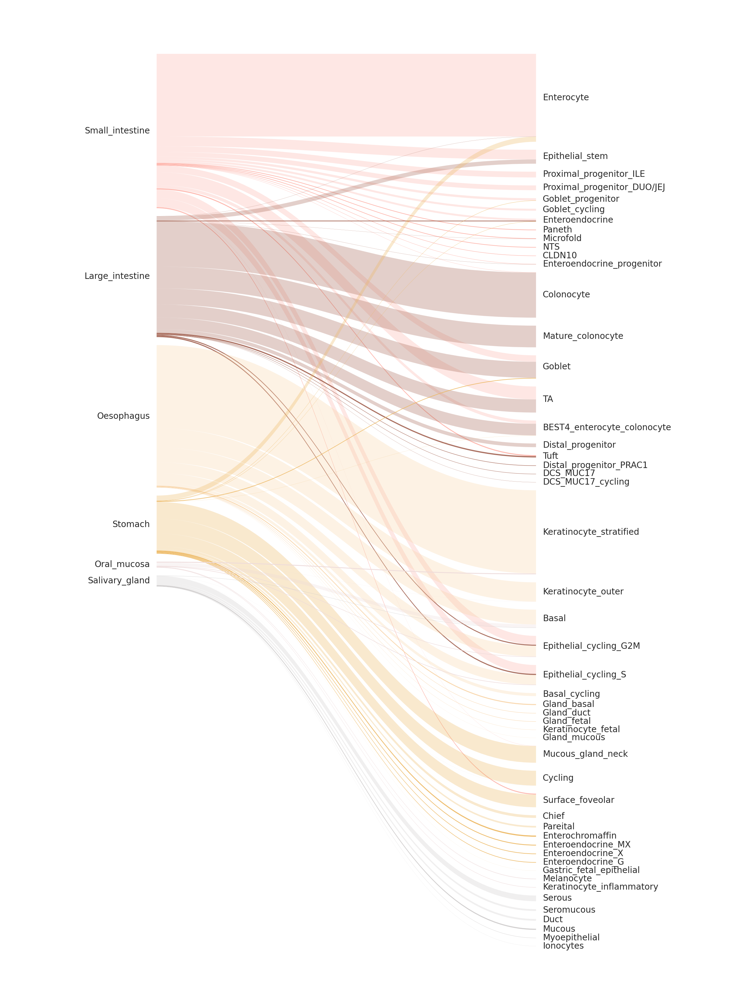

In [50]:
organ_order_2 = ['Small_intestine','Large_intestine','Oesophagus','Stomach','Oral_mucosa','Salivary_gland']
fig, ax = plt.subplots(figsize=(10,14))
sankey.sankey(x=epi.obs["organ_groups"], y=epi.obs["level_3_annot"], ax=ax, fontsize="x-small",left_order=organ_order_2,colors=coldict_organ)
plt.savefig('epi_organ_to_fine_annot_sankey_2_JULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

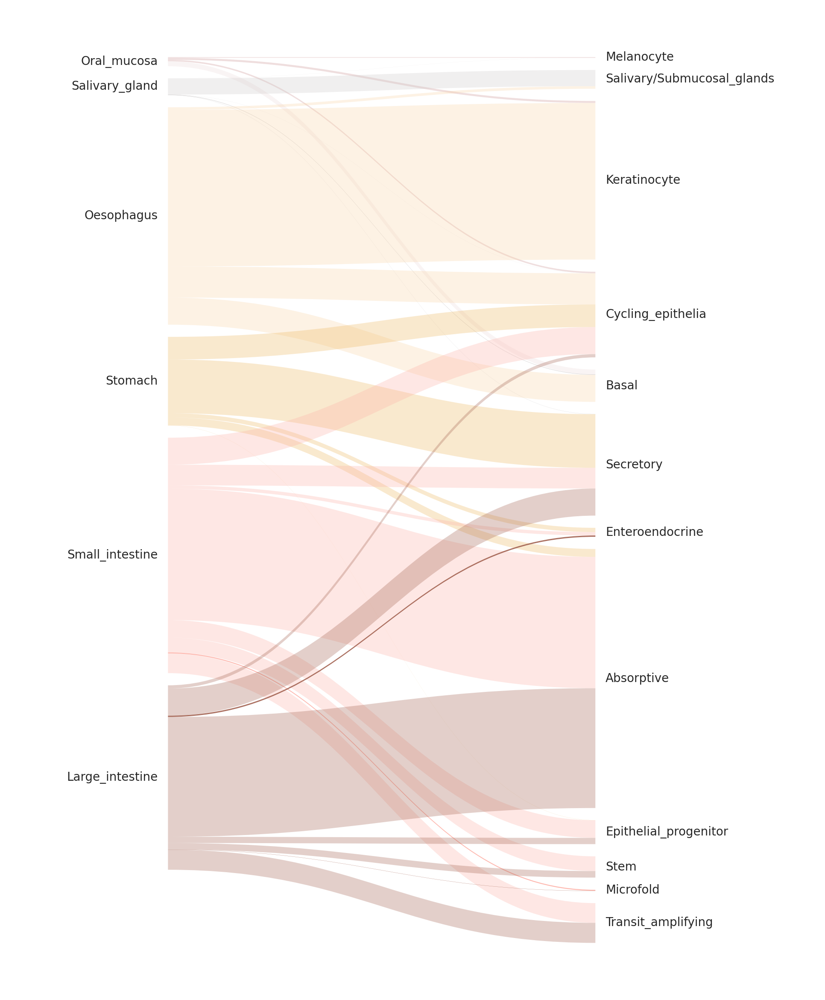

In [51]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=epi.obs["organ_groups"], y=epi.obs["level_2_annot"], ax=ax, fontsize="x-small",left_order=organ_order,colors=coldict_organ)
plt.savefig('level2toorgan_epi_JULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

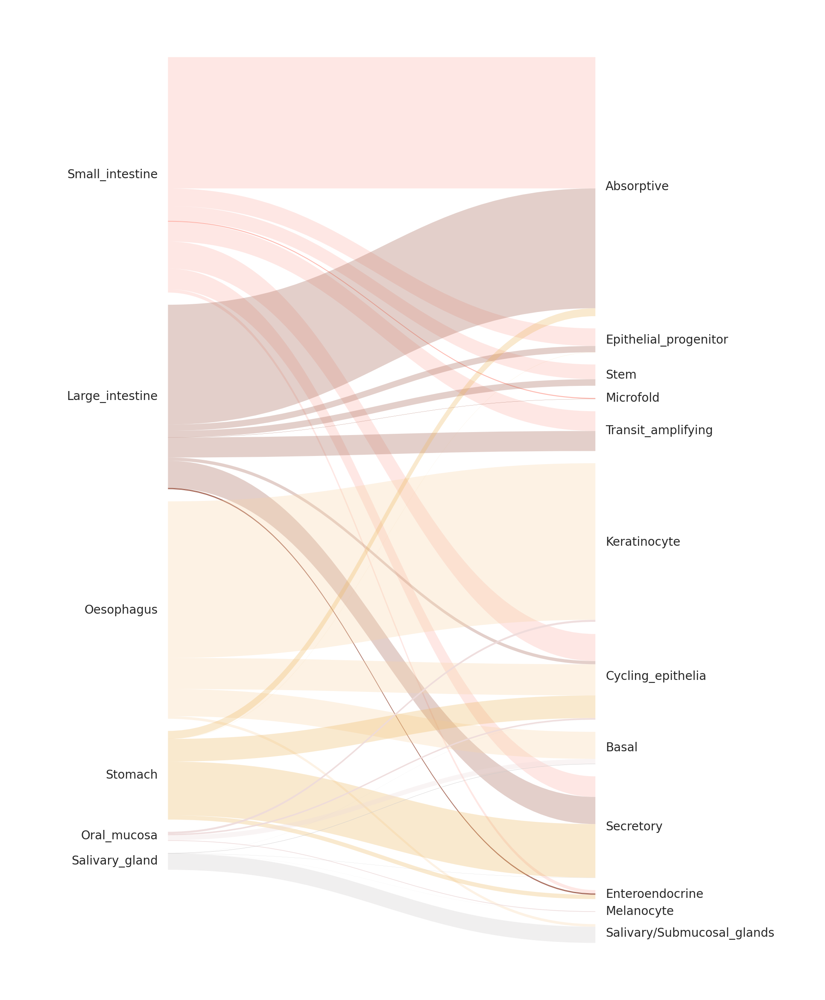

In [52]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=epi.obs["organ_groups"], y=epi.obs["level_2_annot"], ax=ax, fontsize="x-small",left_order=organ_order_2, colors=coldict_organ)
plt.savefig('levelorganto2_epi_JULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [53]:
epi_col_2 = {'Absorptive':'#e6ab02',
             'Epithelial_progenitor':'#d19815',
           'Stem':'#bc861e',
             'Microfold':'#a77422',
                'Transit_amplifying':'#936225',
             'Keratinocyte':'#7f5126',
           'Cycling_epithelia':'#6b4027',
             'Basal':'#583026',
                'Secretory':'#462124',
           'Enteroendocrine':'#331222',
             'Melanocyte':'#2b122a',
             'Salivary/Submucosal_glands':'#201233'}

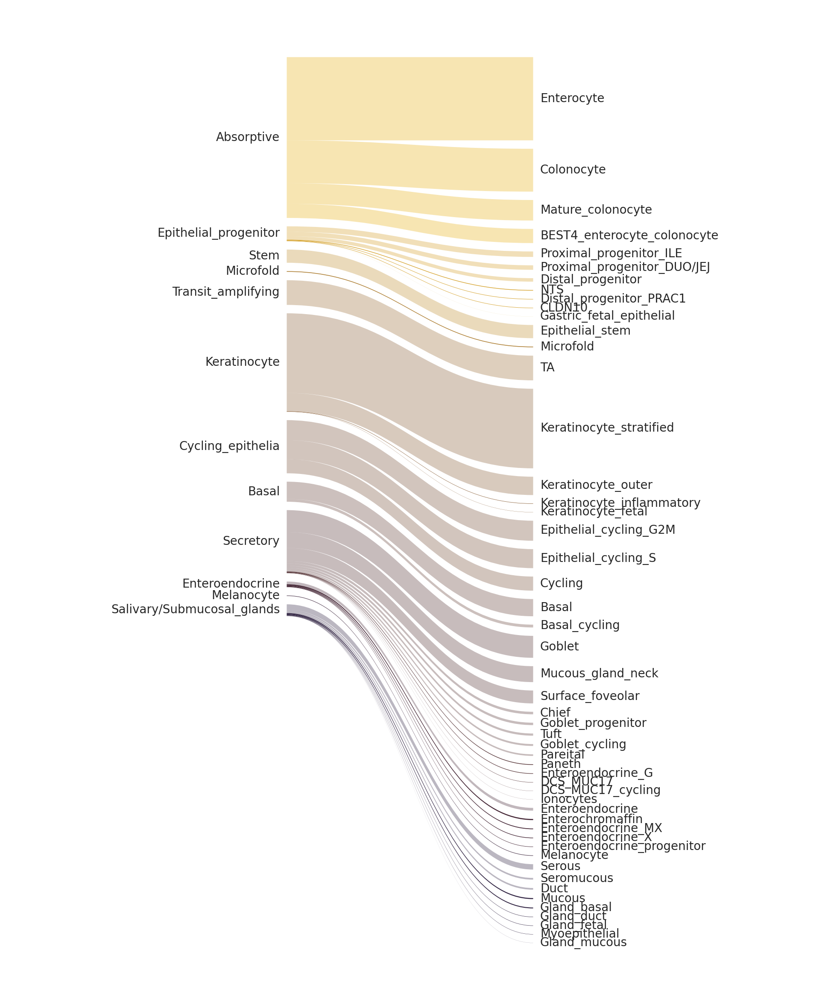

In [54]:
epi_order_2 = ['Absorptive','Epithelial_progenitor','Stem','Microfold','Transit_amplifying','Keratinocyte','Cycling_epithelia',
                'Basal','Secretory','Enteroendocrine','Melanocyte','Salivary/Submucosal_glands',
               ]

fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=epi.obs["level_2_annot"], y=epi.obs["level_3_annot"], ax=ax, fontsize="x-small",left_order=epi_order_2,colors=epi_col_2)
plt.savefig('level2to3_epi_JULY2023.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [166]:
Epi = adata[adata.obs['broad_annot_20220917'].isin(['Epithelial'])].copy()

In [173]:
SI = epi[[i in ['duodenum', 'ileum', 'jejunum', 'intestine', 'small intestine','MLN']
             for i in epi.obs['organ_unified']]].copy()

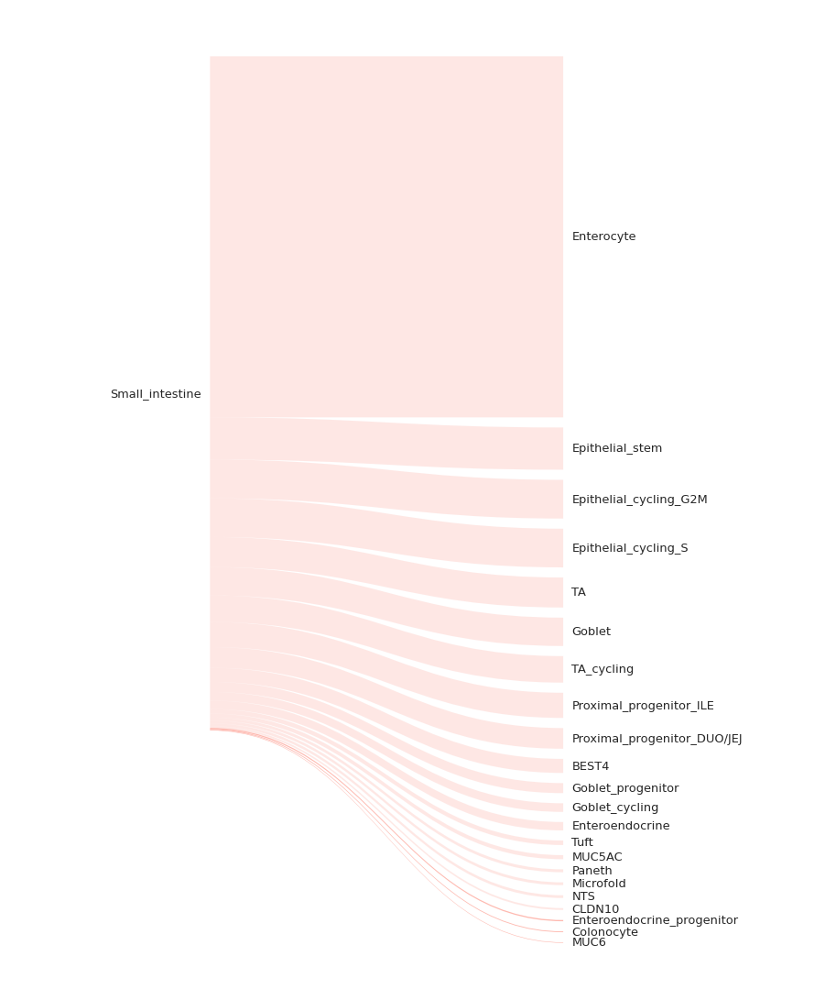

In [176]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=SI.obs["organ_groups"], y=SI.obs["level_3_annot"], ax=ax, fontsize="x-small",colors=coldict_organ)
plt.savefig('organ_groupstoannot3_SI_epi.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

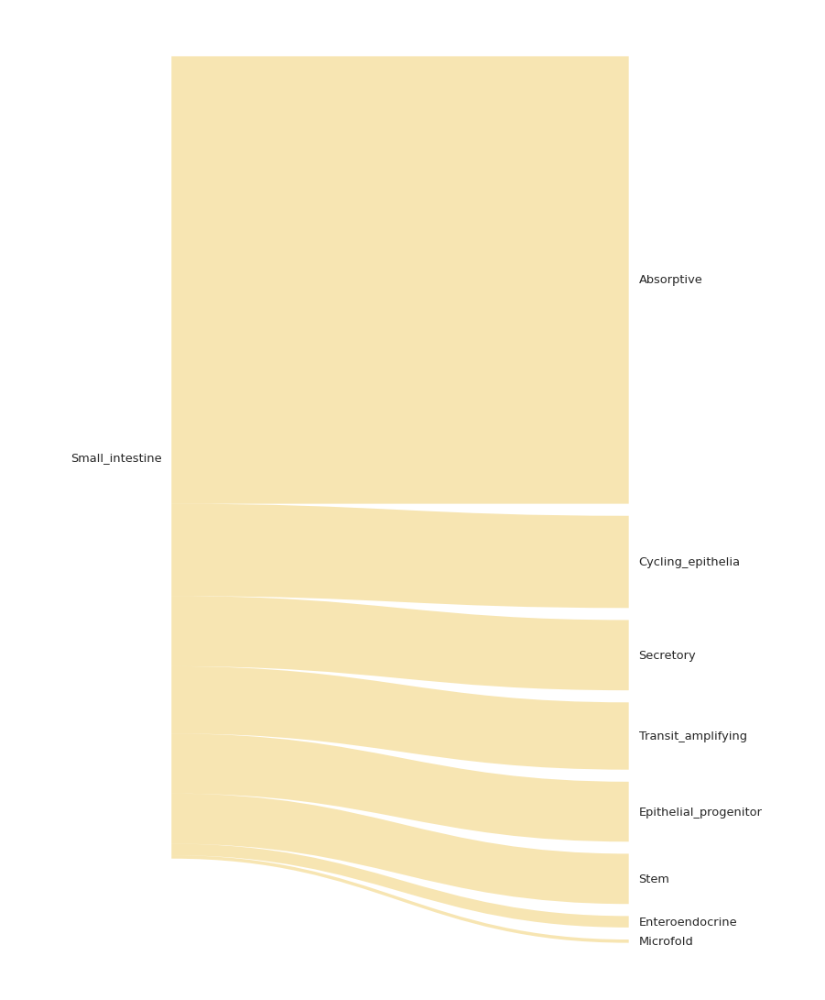

In [180]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=SI.obs["organ_groups"], y=SI.obs["level_2_annot"], ax=ax, fontsize="x-small",colors={'Small_intestine':'#e6ab02'})
plt.savefig('organ_groupstoannot2_SI_epi.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

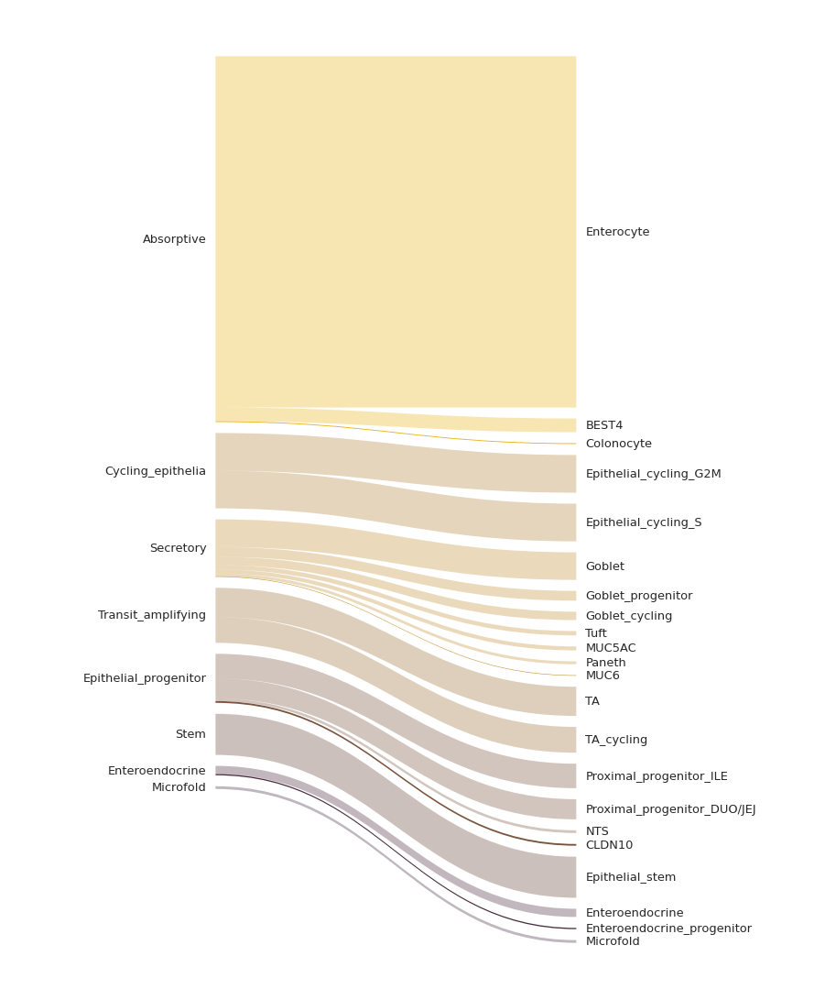

In [179]:
fig, ax = plt.subplots(figsize=(8,10))
sankey.sankey(x=SI.obs["level_2_annot"], y=SI.obs["level_3_annot"], ax=ax, fontsize="x-small",colors=epi_col)
plt.savefig('organ_groupstoannot2_SI_epi.pdf',dpi=300, bbox_inches="tight")
plt.show()
plt.close()

In [3]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_healthy.no_doublets.annot_all_levels.updated_donorID.20230126.h5ad')

In [5]:
adata.obs.organ_unified.unique()

['gingival mucosa', 'stomach', 'duodenum', 'ileum', 'salivary gland', ..., 'oesophagus', 'small intestine', 'intestine', 'periodontium', 'buccal mucosa']
Length: 20
Categories (20, object): ['gingival mucosa', 'stomach', 'duodenum', 'ileum', ..., 'small intestine', 'intestine', 'periodontium', 'buccal mucosa']

In [6]:
adata.obs['organ_groups'] = (
    adata.obs["organ_unified"]
    .map(lambda x: {
        'gingival mucosa':'Oral_mucosa',
 'stomach':'Stomach',
 'duodenum':'Small_intestine',
 'ileum':'Small_intestine',
 'salivary gland':'Salivary_gland',
 'caecum':'Large_intestine',
 'colon':'Large_intestine',
 'MLN':'Small_intestine',
 'ascending colon':'Large_intestine',
 'transverse':'Large_intestine',
 'descending colon':'Large_intestine',
 'sigmoid colon':'Large_intestine',
 'rectum':'Large_intestine',
 'appendix':'Large_intestine',
 'jejunum':'Small_intestine',
 'oesophagus':'Oesophagus',
 'small intestine':'Small_intestine',
 'intestine':'Small_intestine',
 'periodontium':'Oral_mucosa',
 'buccal mucosa':'Oral_mucosa'
                   }.get(x, x))
    .astype("category")
)

In [7]:
coldict_organ = {'Oral_mucosa':'#eedbdb','Salivary_gland':'#cecbcb','Oesophagus':'#f9d4a7',
                 'Stomach':'#edb75f','Small_intestine':'#feb2a8','Large_intestine':'#a36352'}



In [17]:
adata.obs['organ_groups'].cat.categories

Index(['Large_intestine', 'Oesophagus', 'Oral_mucosa', 'Salivary_gland',
       'Small_intestine', 'Stomach'],
      dtype='object')

In [18]:
adata.obs['organ_groups'].cat.reorder_categories(['Oral_mucosa', 'Salivary_gland','Oesophagus','Stomach','Small_intestine','Large_intestine'], inplace=True)

In [19]:
sc.set_figure_params(
    dpi=140,dpi_save=300,
    fontsize=12,
    frameon=False,
    transparent=True,
)

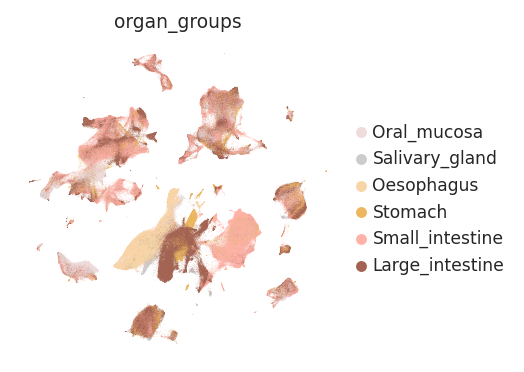

In [20]:
sns.set_style(style="white")
sns.set_context(context="paper")
plt.rcParams['figure.figsize'] = [3,3]
sc.pl.umap(adata,color='organ_groups',palette=coldict_organ,save='healthy_ref_organ_groups.pdf')

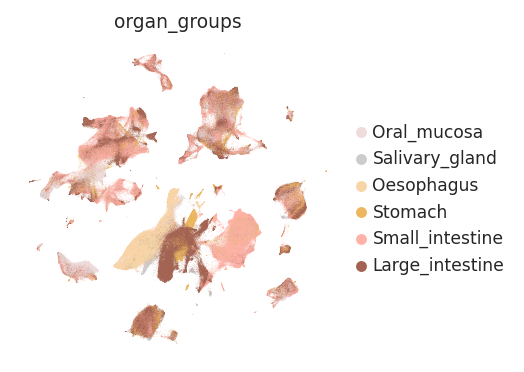

In [21]:
sc.pl.umap(adata,color='organ_groups',palette=coldict_organ,save='healthy_ref_organ_groups.png')

In [22]:
adata.obs.age_unified.cat.categories

Index(['4-7', '6-13_first_trimester', '9-12', '14-20_second_trimester',
       '18-34', '23-31_preterm', '35-54', '47-80', '55-74', '75+'],
      dtype='object')

In [32]:
adata.obs.age_unified.dtype

CategoricalDtype(categories=['4-7', '6-13_first_trimester', '9-12',
                  '14-20_second_trimester', '18-34', '23-31_preterm', '35-54',
                  '47-80', '55-74', '75+'],
, ordered=False)

In [33]:
adata.obs['age_unified'].cat.reorder_categories(['6-13_first_trimester',
'14-20_second_trimester',
'23-31_preterm',
 '4-7',
'9-12',
'18-34',
 '35-54',
'55-74','75+',
 '47-80'], inplace=True)

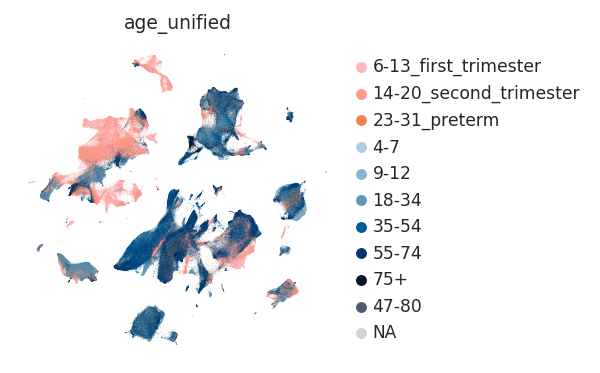

In [36]:
c_age_unified = ['#ffb7b7',#'6-13_first_trimester',
                 '#ff9a89',#'14-20_second_trimester',
                 '#f48154',#'23-31_preterm',
                 '#b3cde0',#'4-7',
                 '#88b3d1',#'9-12', 
                 '#6497b1',#'18-34',  
                 '#005b96',#'35-54', 
                 '#03396c',#'55-74', 
                 '#01122b',#'75+', 
                 '#4d5b70',#'47-80', 
                 '#c2c6cc',#'nan'
    

]
plt.rcParams['figure.figsize'] = [3,3]
sc.pl.umap(adata, color='age_unified',palette=c_age_unified,save='_healthy_reference_age_unified.pdf')

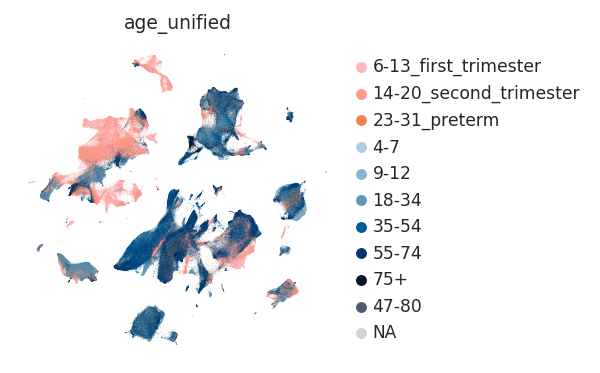

In [37]:
sc.pl.umap(adata, color='age_unified',palette=c_age_unified,save='_healthy_reference_age_unified.png')